! Suggestion for myself: Normalize pressure with std() calculated from random 30 year periods in piControl.

In [1]:
########## IMPORTING NECESSARY LIBRARIES ###################################################################

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
import cartopy.util

* Make arrays for each month
* Calculate std of each month


In [2]:
mean_NH=temp2.var167[:,0:47,:].mean('lon').mean('lat')
jan_std=mean_NH.values[0::12].std()
feb_std=mean_NH.values[1::12].std()
mar_std=mean_NH.values[2::12].std()
apr_std=mean_NH.values[3::12].std()
may_std=mean_NH.values[4::12].std()
jun_std=mean_NH.values[5::12].std()
jul_std=mean_NH.values[6::12].std()
aug_std=mean_NH.values[7::12].std()
sep_std=mean_NH.values[8::12].std()
oct_std=mean_NH.values[9::12].std()
nov_std=mean_NH.values[10::12].std()
dec_std=mean_NH.values[11::12].std()

ymonstd=[jan_std, feb_std, mar_std, apr_std, may_std, jun_std, jul_std, aug_std, sep_std, oct_std,nov_std,dec_std]
np.mean(ymonstd)

NameError: name 'temp2' is not defined

In [ ]:
surf_temp=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_tsurf.nc')

mean_NH=surf_temp.var169[:,0:48,:].mean('lon').mean('lat')
jan_std=mean_NH.values[0::12].std()
feb_std=mean_NH.values[1::12].std()
mar_std=mean_NH.values[2::12].std()
apr_std=mean_NH.values[3::12].std()
may_std=mean_NH.values[4::12].std()
jun_std=mean_NH.values[5::12].std()
jul_std=mean_NH.values[6::12].std()
aug_std=mean_NH.values[7::12].std()
sep_std=mean_NH.values[8::12].std()
oct_std=mean_NH.values[9::12].std()
nov_std=mean_NH.values[10::12].std()
dec_std=mean_NH.values[11::12].std()

ymonstd=[jan_std, feb_std, mar_std, apr_std, may_std, jun_std, jul_std, aug_std, sep_std, oct_std, nov_std, dec_std]
np.mean(ymonstd)


In [ ]:
ensmean = xr.open_dataset('../../NIRD/NIRD/sea_ice/ensmeans/ue536ensmean.nc')
ensmean.variables

# NAO

NAO-index: $$\frac{SLP_{exp}^{L} - \overline{SLP_{ctrl}^{L}}}{std(SLP^{L}_{ctrl})} - \frac{SLP_{exp}^{R} - \overline{SLP_{ctrl}^{R}}}{std(SLP^{R}_{ctrl})}$$

SLP anomaly (ensemble mean of 12 experimental runs minus multi year monthly mean piControl) divided by multi year monthly standard deviation of piControl.

Two approaches:
1) Monthly/seasonal anomalies divided by standard deviation for each month/season. 
2) Monthly/seasonal anomalies divided by mean standard deviation (one value) of all months

In [6]:
# define indices for Lisbon and Reykjavik

L_i, L_j = -5,27
R_i, R_j = -12,13

## Monthly NAO index

In [10]:
# Upload data: slp anomaly, ensemble mean, piControl and SLP standard deviation calculated with CDO (ymonstd: multiyear
# monthly standard deviation of piControl)

anom_slp = xr.open_dataset('../../NIRD/NIRD/slp/exp/slp_anomaly.nc')
ensmean = xr.open_dataset('../../NIRD/NIRD/sea_ice/ensmeans/ue536ensmean.nc')
piControl = xr.open_dataset('../../NIRD/NIRD/DKRZ/piControl_r1i1p1-LR_echam6_BOT_mm_1850-2849_ymonmean.nc')
slp_ymonstd=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_slp_ymonstd.nc')

In [11]:
# Concatenate ymonmean piContorol SLP and std for Lisbon and Reykjavik to 15 year arrays

Lisbon_piControl_15yrs=np.concatenate([piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i]
                                    ])
Reykjavik_piControl_15yrs=np.concatenate([piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i]])



slp_ymonstd_Lisbon_15yrs=np.concatenate([slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i],
                                   slp_ymonstd.var151[:,L_j,L_i]])

slp_ymonstd_Reykjavik_15yrs=np.concatenate([slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i],
                                   slp_ymonstd.var151[:,R_j,R_i]])
                                   
                                

In [12]:
# CALCULATING NAO-INDEX 

Lisbon_sub=np.subtract(ensmean.var151[:,L_j,L_i], Lisbon_piControl_15yrs)
Reykjavik_sub=np.subtract(ensmean.var151[:,R_j,R_i], Reykjavik_piControl_15yrs)

Lisbon=np.divide(Lisbon_sub,slp_ymonstd_Lisbon_15yrs.mean())
Reykjavik=np.divide(Reykjavik_sub,slp_ymonstd_Reykjavik_15yrs.mean())

NAO_monthly=np.subtract(Lisbon,Reykjavik)


Text(0.5,1,'NAO Monthly')

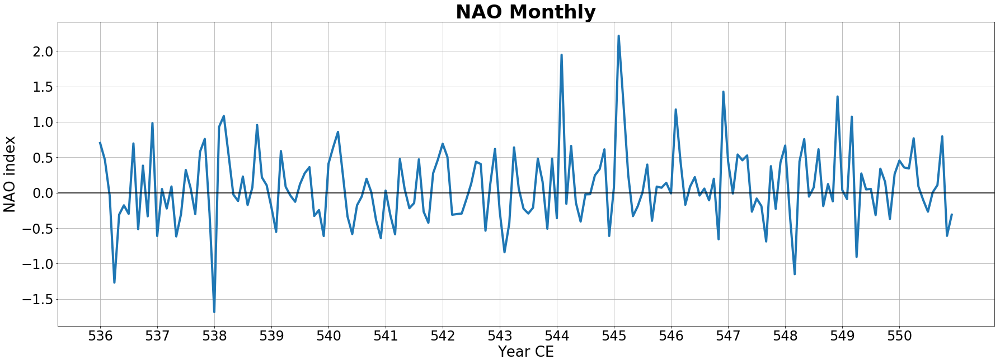

In [13]:
plt.figure(figsize=[30,10])

plt.plot(NAO_monthly, linewidth=4)

plt.xticks(np.arange(0,180,12), ('536', '537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.xlabel('Year CE', fontsize=26)
plt.ylabel('NAO index', fontsize=26)
plt.grid()
plt.axhline(0, color='k') # horizontal lines

plt.title('NAO Monthly', fontsize=34, fontweight='bold')


## Seasonal NAO

In [14]:
# Uploading data: seasonal (DJF,MAM,JJA,SON) mean of 12 experimental runs ensemble mean, piControl seasonal mean and 
# seasonal standard deviation of piControl

ensmean_seasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean.nc')
piControl_seasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/piControl_yseasmean_15yrs.nc')
slp_yseasstd=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_slp_seasstd.nc')

In [15]:
# Make 15 years yseasstd-arrays for Lisbon and Reykjavik

slp_yseasstd_Lisbon_15yrs=np.concatenate([slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i],
                                          slp_yseasstd.var151[:,L_j,L_i]
                                         ])

slp_yseasstd_Reykjavik_15yrs=np.concatenate([slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i],
                                          slp_yseasstd.var151[:,R_j,R_i]
                                         ])

In [26]:
# CALCULATING NAO-INDEX

Lisbon_sub=np.subtract(ensmean_seasmean.var151[0:60,L_j,L_i].values, piControl_seasmean.var151[:,L_j,L_i].values)
Reykjavik_sub=np.subtract(ensmean_seasmean.var151[0:60,R_j,R_i].values, piControl_seasmean.var151[:,R_j,R_i].values)

Lisbon=np.divide(Lisbon_sub,slp_yseasstd_Lisbon_15yrs.mean())
Reykjavik=np.divide(Reykjavik_sub,slp_yseasstd_Reykjavik_15yrs.mean())

NAO_seasonal=np.subtract(Lisbon,Reykjavik)
slp_yseasstd_Reykjavik_15yrs.mean()

663.6619

Text(0.5,1,'Seasonal(DJF,MAM,JJA,SON) NAO-index')

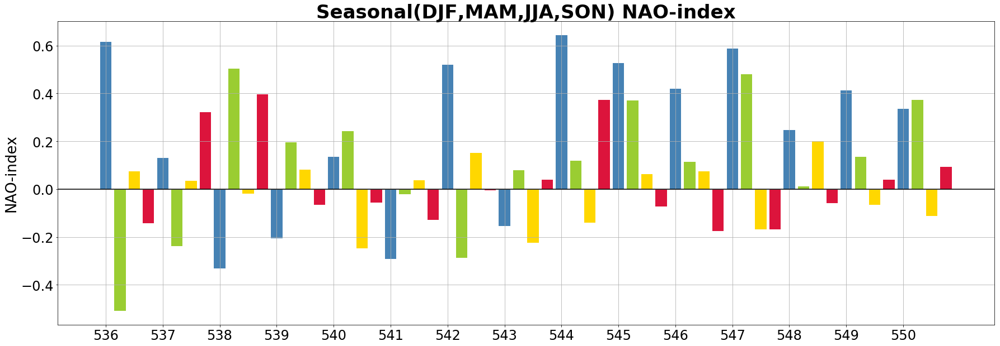

In [27]:
C=['steelblue', 'yellowgreen', 'gold', 'crimson']

plt.figure(figsize=[30,10])

plt.bar(np.arange(0,60), NAO_seasonal, color=C)
plt.ylabel('NAO-index', fontsize=26)
plt.axhline(0, color='k') # horizontal lines
plt.grid()
plt.xticks(np.arange(0,60,4), ('536', '537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.title('Seasonal(DJF,MAM,JJA,SON) NAO-index', fontsize=34, fontweight='bold')


## NDJFM

In [8]:
ensmean_seasmean_NDJFM=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean_NDJFM.nc')
piControl_seasmean_NDJFM=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_slp_NDJFM.nc')
slp_ndjfm_std=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_slp_NDJFM_timselstd.nc')
slp_ndjfm_std_Lisbon=slp_ndjfm_std.var151[:,L_j,L_i].mean()
slp_ndjfm_std_Reykjavik=slp_ndjfm_std.var151[:,R_j,R_i].mean()

slp_ndjfm_std.var151[:,L_j,L_i].mean()


<xarray.DataArray 'var151' ()>
array(389.61456, dtype=float32)
Coordinates:
    lon      float64 350.6
    lat      float64 38.24

In [9]:
Lisbon_NDJFM_sub=np.subtract(ensmean_seasmean_NDJFM.var151[:,L_j,L_i],piControl_seasmean_NDJFM.var151[:,L_j,L_i].mean())
Reykjavik_NDJFM_sub=np.subtract(ensmean_seasmean_NDJFM.var151[:,R_j,R_i], piControl_seasmean_NDJFM.var151[:,R_j,R_i].mean())

Lisbon_NDJFM=np.divide(Lisbon_NDJFM_sub,slp_ndjfm_std.var151[:,L_j,L_i])
Reykjavik_NDJFM=np.divide(Reykjavik_NDJFM_sub, slp_ndjfm_std.var151[:,R_j,R_i])

NAO_NDJFM=np.subtract(Lisbon_NDJFM,Reykjavik_NDJFM)
NAO_NDJFM

<xarray.DataArray 'var151' (time: 0)>
array([], dtype=float32)
Coordinates:
  * time     (time) float64 

ValueError: shape mismatch: objects cannot be broadcast to a single shape

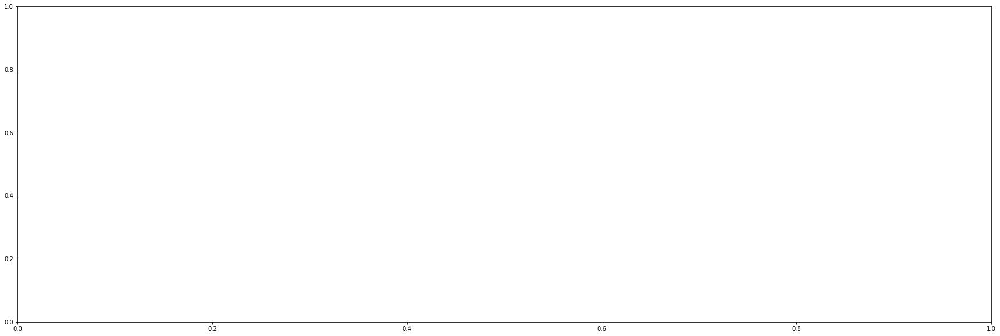

In [31]:
plt.figure(figsize=[30,10])

plt.bar(np.arange(0,15), NAO_NDJFM, color='steelblue')
plt.ylabel('NAO-index', fontsize=26)
plt.axhline(0, color='k') # horizontal lines
plt.grid()
plt.xticks(np.arange(0,15), ('536', '537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.title('NDJFM NAO-index', fontsize=34, fontweight='bold')

In [ ]:
plt.figure(figsize=[30,10])

plt.bar(np.arange(0,15), NAO_seasonal[0:60:4], color='steelblue')
plt.ylabel('NAO-index', fontsize=26)
plt.axhline(0, color='k') # horizontal lines
plt.grid()
plt.xticks(np.arange(0,15), ('536', '537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.title('DJF NAO-index', fontsize=34, fontweight='bold')

#  NAO HOMEMADE RECIPE (seasonal)

In [10]:
L_i, L_j = -5,27
R_i, R_j = -12,13

In [11]:
ensmean_seasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean.nc')
piControl_seasmean=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_slp_seasmeans.nc')
piControl_yseasmean_15yrs=xr.open_dataset('../../NIRD/NIRD/seasmean/piControl_yseasmean_15yrs.nc')

In [12]:
L_std=piControl_seasmean.var151[0::4,L_j,L_i].std()
L_std=[L_std, L_std, L_std, L_std, L_std, 
                      L_std, L_std, L_std, L_std, L_std, 
                      L_std, L_std, L_std, L_std, L_std]
R_std=piControl_seasmean.var151[0::4,R_j,R_i].std()
R_std=[R_std, R_std, R_std, R_std, R_std, 
                      R_std, R_std, R_std, R_std, R_std, 
                      R_std, R_std, R_std, R_std, R_std]

L_slp_ensmean=ensmean_seasmean.var151[4::4,L_j,L_i]
R_slp_ensmean=ensmean_seasmean.var151[4::4,R_j,R_i]

L_slp_piControl=piControl_yseasmean_15yrs.var151[0::4,L_j,L_i]
R_slp_piControl=piControl_yseasmean_15yrs.var151[0::4,R_j,R_i]

In [70]:
Lisbon_anom=np.subtract(L_slp_ensmean.data,L_slp_piControl.data)
Lisbon=np.divide(Lisbon_anom,L_std)

Reykjavik_anom=np.subtract(R_slp_ensmean.data,R_slp_piControl.data)
Reykjavik=np.divide(Reykjavik_anom,R_std)

NAO_index=np.subtract(Lisbon,Reykjavik)
NAO_index

array([ 1.5651896 , -3.43156759, -2.2026994 ,  1.64597536, -3.15555288,
        5.84662413, -1.59998913,  7.35866481,  5.83225061,  4.07210868,
        6.15176225,  2.32364174,  4.41441273,  3.74736169, -4.50706357])

Text(0.5,1,'DJF NAO-index  (homemade recipe)')

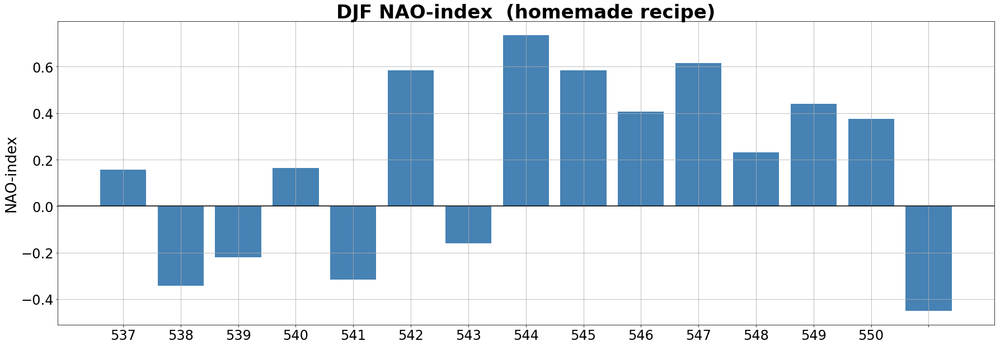

In [72]:
plt.figure(figsize=[30,10])

plt.bar(np.arange(0,15), NAO_index, color='steelblue')
plt.ylabel('NAO-index', fontsize=26)
plt.axhline(0, color='k') # horizontal lines
plt.grid()
plt.xticks(np.arange(0,15), ('537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.title('DJF NAO-index  (homemade recipe)', fontsize=34, fontweight='bold')

# POSTER-PLOTS

In [16]:
########## GENERATE LISTS OF MONTH-IN-YEAR INDICES, COLORS AND STRINGS ######################################

jan=np.empty(shape=[15,1])
feb=np.empty(shape=[15,1])
mar=np.empty(shape=[15,1])
apr=np.empty(shape=[15,1])
may=np.empty(shape=[15,1])
jun=np.empty(shape=[15,1])
jul=np.empty(shape=[15,1])
aug=np.empty(shape=[15,1])
sep=np.empty(shape=[15,1])
octo=np.empty(shape=[15,1])
nov=np.empty(shape=[15,1])
dec=np.empty(shape=[15,1])

DJF=np.empty(shape=[15,1])
MAM=np.empty(shape=[15,1])
JJA=np.empty(shape=[15,1])
SON=np.empty(shape=[15,1])

plt_colors=['crimson','steelblue','forestgreen','navy','orange','plum','deeppink','yellow',
            'slategrey','olive','darkslategrey','firebrick','rebeccapurple','lightcoral','black']

#plt_colors=['crimson','steelblue','forestgreen','grey','orange','navy','deeppink','yellow',
            #'grey','grey','grey','grey','grey','grey','black']


for i in range(0,15):
    jan[i]=12*i
    feb[i]=12*i + 1
    mar[i]=12*i + 2
    apr[i]=12*i + 3
    may[i]=12*i + 4
    jun[i]=12*i + 5
    jul[i]=12*i + 6
    aug[i]=12*i + 7
    sep[i]=12*i + 8
    octo[i]=12*i + 9
    nov[i]=12*i + 10
    dec[i]=12*i +11
    
    DJF[i]=4*i
    MAM[i]=4*i + 1
    JJA[i]=4*i + 2
    SON[i]=4*i + 3
    

    
months = [jan, feb, mar, apr, may, jun, jul, aug, sep, octo, nov, dec]
str_months=["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]

seasons = [DJF, MAM, JJA, SON]
str_seasons = ["DJF", "MAM", "JJA", "SON"]
season_colors = ['b', 'g', 'y', 'r']

In [17]:
piControl_yseasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/piControl_yseasmean.nc')
anomalies=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean_anomalies.nc')

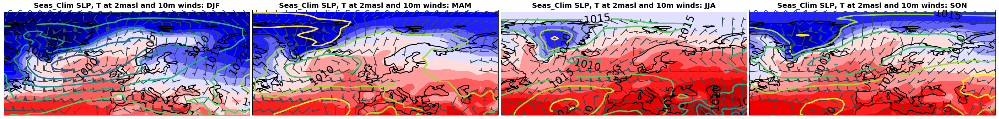

In [18]:
########## PLOT: SEASONAL MEAN PICONTROL CLIMATOLOGY, SLP-CONTOURS #########################################################

#------Select files to run, and season ----------------------------------------------------------------------

run=piControl_yseasmean
slp_run=run.var151/100

run_str='Seas_Clim'



#------ Fixing data - shift to move white line to edge ------------------------------------------------------


shift_T, shift_T_lon=cartopy.util.add_cyclic_point(run.temp2.data, coord=run.lon.data)
sP,sPl=cartopy.util.add_cyclic_point(run.var151.data, coord=run.lon.data)
shift_P, shift_P_lon=cartopy.util.add_cyclic_point(sP.data, coord=sPl.data)

shift_T=shift_T-273

#------ Define stuff ---------------------------------------------------------------------------------------

west, east, south, north = [-70, 70, 30, 90]
X,Y = np.meshgrid(run.v10.lon.data, run.v10.lat.data)
x,y = np.meshgrid(run.v10.lon.data[::3], run.v10.lat.data[::3])
slp_levels=[980,985,990,995,1000, 1005, 1010, 1015,1020, 1025,1030,1035]


#----- Plot: Seasonal mean Temp10, SLP and 10m winds ---------------------------------------------------------
for i in range(1):
    year=i
    fig = plt.figure(figsize=[50, 40])
    plt.subplots_adjust(wspace=0.01, hspace=0)
    
    for j in range(4):
        
        plt_season=seasons[j]
        str_season=str_seasons[j]
        
        ax = fig.add_subplot(1, 4, j+1, projection=ccrs.PlateCarree())
        ax.set_extent([west,east,south,north], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND,edgecolor='k')
        ax.coastlines(linewidth=2.5)

        

        map=ax.contourf(shift_T_lon, run.temp2.lat.data, shift_T[int(plt_season[i])] ,levels=np.arange(-40,40, 5), 
                         extend='both',vmin=-40, vmax=40,cmap='seismic', transform=ccrs.PlateCarree())
             

        
    
        CS=ax.contour(shift_P_lon,run.lat.data,shift_P[int(plt_season[i]), :,:]/100,levels=slp_levels,
                      transform=ccrs.PlateCarree(),linewidths=4)

        plt.clabel(CS,inline=1, fontsize=30, fmt='%1.0f', colors='k')
        
        
        ax.barbs(x, y, run.u10[int(plt_season[i]),::3,::3], run.v10[int(plt_season[i]),::3,::3],pivot='middle', length=7, sizes=dict(emptybarb=0.0000001, height=0.5),
                 linewidth=2, color='darkslategrey',barb_increments=dict(half=1, full=2, flag=5), transform=ccrs.PlateCarree())
        ax.set_title(run_str + ' SLP, T at 2masl and 10m winds: ' + str_season,fontsize=20,fontweight='bold')
        
        
    plt.show()

In [19]:
########## OPEN DATASET: Seasonal mean Anomalies################################################

anomalies=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean_anomalies.nc')

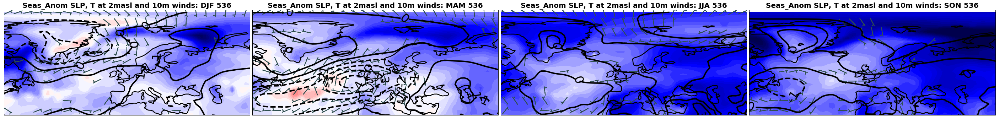

In [20]:
########## PLOT: SEASONAL MEAN ANOMALIES, SLP-CONTOURS #########################################################

#------Select files to run, and season ----------------------------------------------------------------------

run=anomalies
slp_run=anomalies.var151/100

run_str='Seas_Anom'



#------ Fixing data - shift to move white line to edge ------------------------------------------------------


shift_T, shift_T_lon=cartopy.util.add_cyclic_point(run.temp2.data, coord=run.lon.data)
sP,sPl=cartopy.util.add_cyclic_point(run.var151.data, coord=run.lon.data)
shift_P, shift_P_lon=cartopy.util.add_cyclic_point(sP.data, coord=sPl.data)

#shift_T=shift_T-273

#------ Define stuff ---------------------------------------------------------------------------------------

west, east, south, north = [-70, 70, 30, 90]
X,Y = np.meshgrid(run.v10.lon.data, run.v10.lat.data)
x,y = np.meshgrid(run.v10.lon.data[::3], run.v10.lat.data[::3])
slp_levels=[-5.0,-4.0,-3.0,-2.0,-1.0,0.0,1.0, 2.0, 3.0, 4.0,5.0]


#----- Plot: Seasonal mean Temp10, SLP and 10m winds ---------------------------------------------------------
for i in range(1):
    year=i
    fig = plt.figure(figsize=[50, 40])
    plt.subplots_adjust(wspace=0.01, hspace=0)
    
    for j in range(4):
        
        plt_season=seasons[j]
        str_season=str_seasons[j]
        
        ax = fig.add_subplot(1, 4, j+1, projection=ccrs.PlateCarree())
        ax.set_extent([west,east,south,north], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND,edgecolor='k')
        ax.coastlines(linewidth=2.5, color='k')

        

        map=ax.contourf(shift_T_lon, run.temp2.lat.data, shift_T[int(plt_season[i])] ,levels=np.arange(-5,5, 0.2), 
                         extend='both',vmin=-5, vmax=5,cmap='seismic',transform=ccrs.PlateCarree())
             

        
    
        CS=ax.contour(shift_P_lon,run.lat.data,shift_P[int(plt_season[i]), :,:]/100,levels=slp_levels, colors='k',
                      transform=ccrs.PlateCarree(),linewidths=4)

        plt.clabel(CS,inline=1, fontsize=34, fmt='%1.0f', colors='k')
        
        
        ax.barbs(x, y, run.u10[int(plt_season[i]),::3,::3], run.v10[int(plt_season[i]),::3,::3],pivot='middle', length=7, sizes=dict(emptybarb=0.0000001, height=0.5),
                 linewidth=2, color='darkslategrey',barb_increments=dict(half=1, full=2, flag=5), transform=ccrs.PlateCarree())
        ax.set_title(run_str + ' SLP, T at 2masl and 10m winds: ' + str_season + ' '+ str(536+i),fontsize=20,fontweight='bold')
        
    
    #cbar = plt.colorbar(map, fraction=0.2, shrink=0.1, extend='both')
    #cbar.set_label('T [C]', fontsize=20)
    #cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(),fontsize=20)
    #plt.savefig('figs/seasmean_anomalies/' + run_str  + season_str + year_str + 'windbarbs_white',bbox_inches='tight')
    plt.show()

# SLP abs. values, SLP anoms and abs. winds

In [13]:
anomalies=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean_anomalies.nc')
piControl_yseasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/piControl_yseasmean.nc')
ensmean_seasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean.nc')



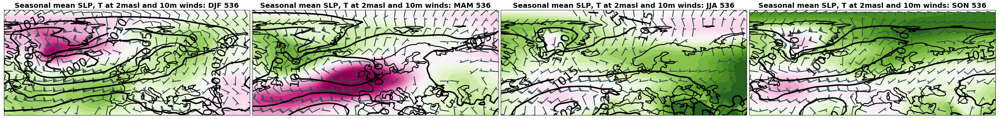

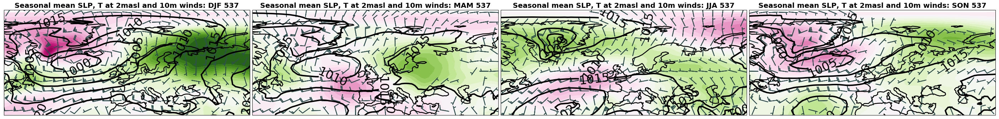

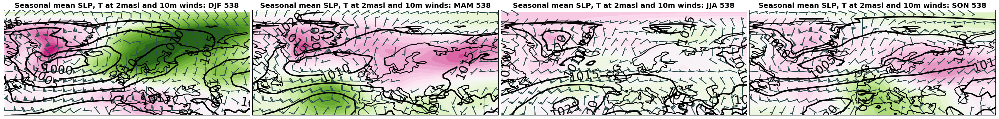

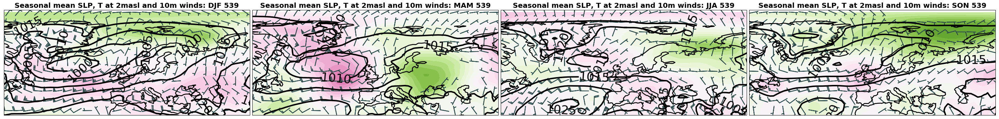

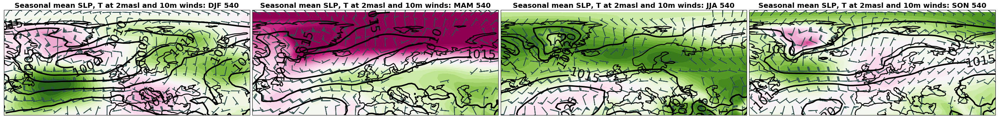

...

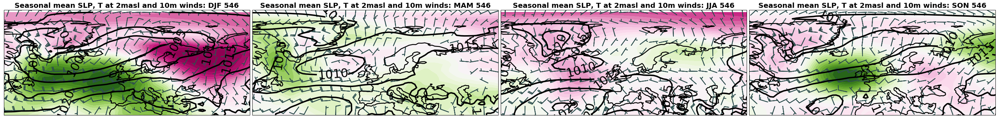

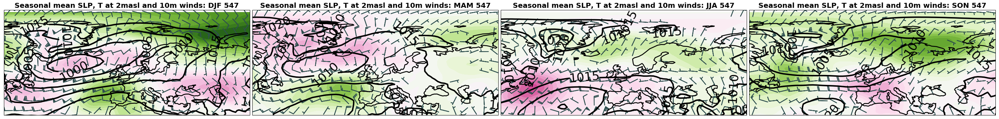

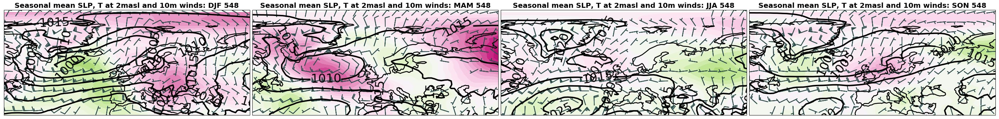

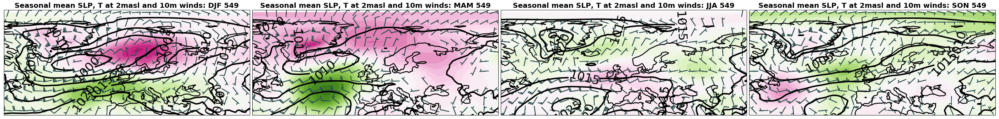

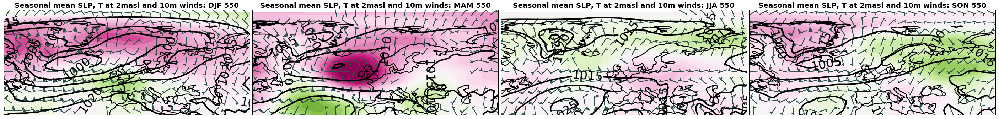

In [17]:
########## PLOT: SEASONAL MEAN SLP-CONTOURS  (ABS.+ ANOM.), ABS. WIND10#########################################################

#------Select files to run, and season ----------------------------------------------------------------------

anom=anomalies
absval=ensmean_seasmean
slp_anom=anomalies.var151/100

run_str='Seasonal mean'



#------ Fixing data - shift to move white line to edge ------------------------------------------------------


sP_abs,sPl_abs=cartopy.util.add_cyclic_point(absval.var151.data, coord=absval.lon.data)
shift_P, shift_P_lon=cartopy.util.add_cyclic_point(sP_abs.data, coord=sPl_abs.data)

sP_anom, sPl_anom=cartopy.util.add_cyclic_point(anom.var151.data, coord=anom.lon.data)
shift_P_anom, shift_P_lon_anom=cartopy.util.add_cyclic_point(sP_anom.data, coord=sPl_anom.data)

#shift_T=shift_T-273

#------ Define stuff ---------------------------------------------------------------------------------------

west, east, south, north = [-70, 70, 30, 90]
X,Y = np.meshgrid(absval.v10.lon.data, absval.v10.lat.data)
x,y = np.meshgrid(absval.v10.lon.data[::3], absval.v10.lat.data[::3])
slp_anom_levels=[-5.0,-4.0,-3.0,-2.0,-1.0,0.0,1.0, 2.0, 3.0, 4.0,5.0]
slp_abs_levels=[980,985,990,995,1000, 1005, 1010, 1015,1020, 1025,1030,1035]

#----- Plot: Seasonal mean Temp10, SLP and 10m winds ---------------------------------------------------------
for i in range(15):
    year=i
    fig = plt.figure(figsize=[50, 40])
    plt.subplots_adjust(wspace=0.01, hspace=0)
    
    for j in range(4):
        
        plt_season=seasons[j]
        str_season=str_seasons[j]
        
        ax = fig.add_subplot(1, 4, j+1, projection=ccrs.PlateCarree())
        ax.set_extent([west,east,south,north], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND,edgecolor='k')
        ax.coastlines(linewidth=2.5, color='k')

        

        map=ax.contourf(shift_P_lon_anom, anom.var151.lat.data, shift_P_anom[int(plt_season[i])]/100 ,levels=np.arange(-3,3, 0.2), 
                         extend='both',vmin=-3, vmax=3,cmap='PiYG',transform=ccrs.PlateCarree())
             

        
    
        CS=ax.contour(shift_P_lon,absval.lat.data,shift_P[int(plt_season[i]), :,:]/100,levels=slp_abs_levels, colors='k',
                      transform=ccrs.PlateCarree(),linewidths=4)

        plt.clabel(CS,inline=1, fontsize=34, fmt='%1.0f', colors='k')
        
        
        ax.barbs(x, y, absval.u10[int(plt_season[i]),::3,::3], absval.v10[int(plt_season[i]),::3,::3],pivot='middle', length=7, sizes=dict(emptybarb=0.0000001, height=0.5),
                 linewidth=2, color='darkslategrey',barb_increments=dict(half=1, full=2, flag=5), transform=ccrs.PlateCarree())
        ax.set_title(run_str + ' SLP, T at 2masl and 10m winds: ' + str_season + ' '+ str(536+i),fontsize=20,fontweight='bold')
        
    
    #cbar = plt.colorbar(map, fraction=0.2, shrink=0.1, extend='both')
    #cbar.set_label('P [hPa]', fontsize=20)
    #cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(),fontsize=20)
    #plt.savefig('figs/seasmean_anomalies/' + run_str  + season_str + year_str + 'windbarbs_white',bbox_inches='tight')
    plt.show()

# DIV

In [23]:
piControl_ymonmean=xr.open_dataset('../../NIRD/NIRD/sea_ice/total_area/NorHem/piControl_seaice_area_15yr.nc')

piControl_full=xr.open_dataset('../../NIRD/NIRD/piControl_BOT_1850-2849_seaice_area_NH.nc')

piFull=np.concatenate([piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[:,0,0],
                       piControl_ymonmean.seaice[:,0,0],piControl_ymonmean.seaice[0:60,0,0]])
piFull.shape
piControl_full.var210.shape

(9600, 1, 1)

In [24]:
anom=np.subtract(piControl_full.var210[:,0,0],piFull)
anom.std()

<xarray.DataArray 'var210' ()>
array(4.926364e+11)
Coordinates:
    lon      float32 0.0
    lat      float32 0.0

### Reykjavik & Lisbon lon-lat indices:

In [25]:

L_i, L_j = -5,27
R_i, R_j = -12,13


## Monthly NAO-index

NAO-index=

In [26]:
########## CALCULATE AND PLOT: MONTHLY NAO-INDEX #########################################################################


Text(0.5,1,'slp_Lisbon - slp_Reykjavik')

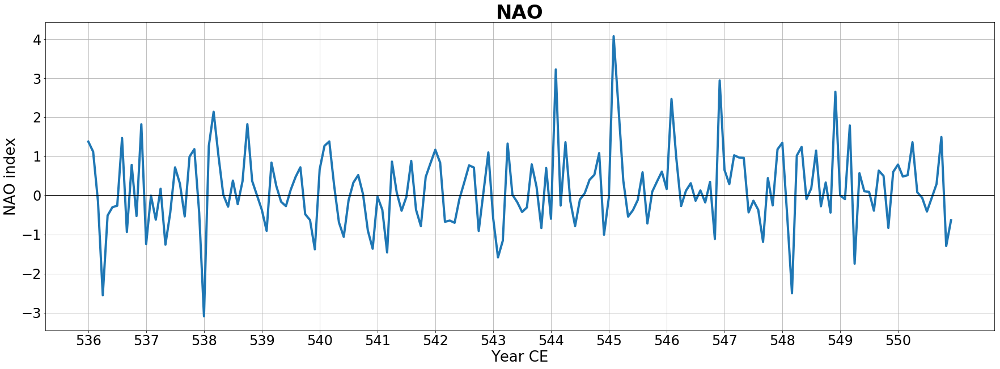

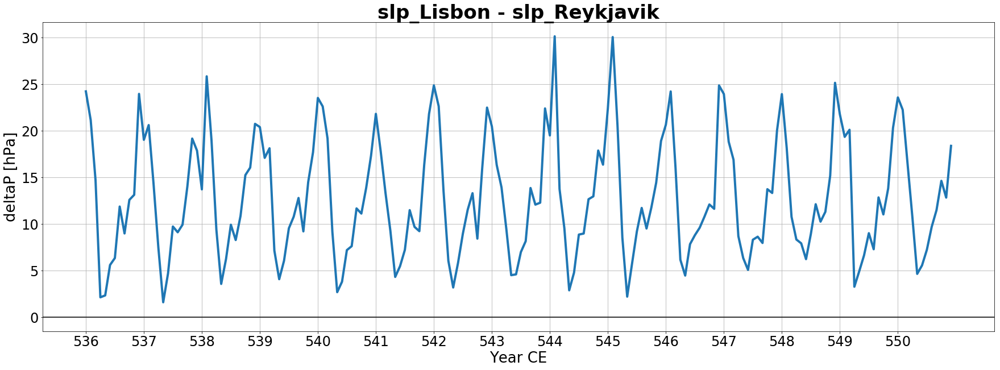

In [27]:
########## CALCULATE AND PLOT: MONTHLY NAO-INDEX #########################################################################

ensmean = xr.open_dataset('../../NIRD/NIRD/sea_ice/ensmeans/ue536ensmean.nc')
piControl = xr.open_dataset('../../NIRD/NIRD/DKRZ/piControl_r1i1p1-LR_echam6_BOT_mm_1850-2849_ymonmean.nc')
seasonal_anomalies=xr.open_dataset('../../NIRD/NIRD/seasmean/ensmean_seasmean_anomalies.nc')
piControl_seasmean=xr.open_dataset('../../NIRD/NIRD/seasmean/piControl_yseasmean.nc')


Lisbon_piControl_15yrs=np.concatenate([piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i],
                                       piControl.var151[:,L_j, L_i]
                                    ])
Reykjavik_piControl_15yrs=np.concatenate([piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i],
                                         piControl.var151[:,R_j, R_i]])


slp_anomaly_Lisbon=np.subtract(ensmean.var151[:,L_j, L_i], Lisbon_piControl_15yrs)
slp_anomaly_Reykjavik=np.subtract(ensmean.var151[:,R_j,R_i], Reykjavik_piControl_15yrs)

piControl_std=piControl.std('time')

slp_diff=np.subtract(ensmean.var151[:,L_j,L_i],ensmean.var151[:,R_j,R_i])
#piControl_std=xr.open_dataset('../../NIRD/NIRD/slp/piControl_std.nc')
#Reykjavik=np.divide(anomalies.var151[:,13,85], piControl_std.var151[0,13,85])
#Lisbon=np.divide(anomalies.var151[:,27,91], piControl_std.var151[0,27,91])

Lisbon=np.divide(slp_anomaly_Lisbon,piControl_std.var151[L_j,L_i])
Reykjavik=np.divide(slp_anomaly_Reykjavik, piControl_std.var151[R_j,R_i])


NAO=np.subtract(Lisbon, Reykjavik)



plt.figure(figsize=[30,10])
#slp_anomaly_Lisbon
plt.plot(NAO, linewidth=4)
#std=piControl.std('time')
#plt.plot(std.var151.values)
#piControl_std.var151[0,27,91]
#piControl_std.var151[0,13,85]


###############################
plt.xticks(np.arange(0,180,12), ('536', '537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.xlabel('Year CE', fontsize=26)
plt.ylabel('NAO index', fontsize=26)
plt.grid()
plt.axhline(0, color='k') # horizontal lines

plt.title('NAO', fontsize=34, fontweight='bold')

#plt.savefig('../../NIRD/NIRD/figs/NAO', bbox_inches='tight')


#---------------------------------------------------------------------------------------------------------------


plt.figure(figsize=[30,10])
#slp_anomaly_Lisbon
plt.plot(slp_diff/100, linewidth=4)
#std=piControl.std('time')
#plt.plot(std.var151.values)
#piControl_std.var151[0,27,91]
#piControl_std.var151[0,13,85]

plt.xticks(np.arange(0,180,12), ('536', '537', '538', '539', '540', '541', '542', '543', '544', '545', '546', '547', '548', '549','550'))
plt.tick_params(axis='both', which='major', labelsize=24)
plt.xlabel('Year CE', fontsize=26)
plt.ylabel('deltaP [hPa]', fontsize=26)
plt.grid()
plt.axhline(0, color='k') # horizontal lines

plt.title('slp_Lisbon - slp_Reykjavik', fontsize=34, fontweight='bold')

#plt.savefig('../../NIRD/NIRD/figs/P_diff', bbox_inches='tight')
